In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/nfl-health-and-safety-helmet-assignment/test_baseline_helmets.csv
/kaggle/input/nfl-health-and-safety-helmet-assignment/sample_submission.csv
/kaggle/input/nfl-health-and-safety-helmet-assignment/train_baseline_helmets.csv
/kaggle/input/nfl-health-and-safety-helmet-assignment/test_player_tracking.csv
/kaggle/input/nfl-health-and-safety-helmet-assignment/train_player_tracking.csv
/kaggle/input/nfl-health-and-safety-helmet-assignment/image_labels.csv
/kaggle/input/nfl-health-and-safety-helmet-assignment/train_labels.csv
/kaggle/input/nfl-health-and-safety-helmet-assignment/images/57655_000176_Sideline_frame583.jpg
/kaggle/input/nfl-health-and-safety-helmet-assignment/images/58088_002963_Sideline_frame135.jpg
/kaggle/input/nfl-health-and-safety-helmet-assignment/images/58000_001306_Sideline_frame83.jpg
/kaggle/input/nfl-health-and-safety-helmet-assignment/images/57795_000267_Sideline_frame419.jpg
/kaggle/input/nfl-health-and-safety-helmet-assignment/images/57760_002043_Endzo

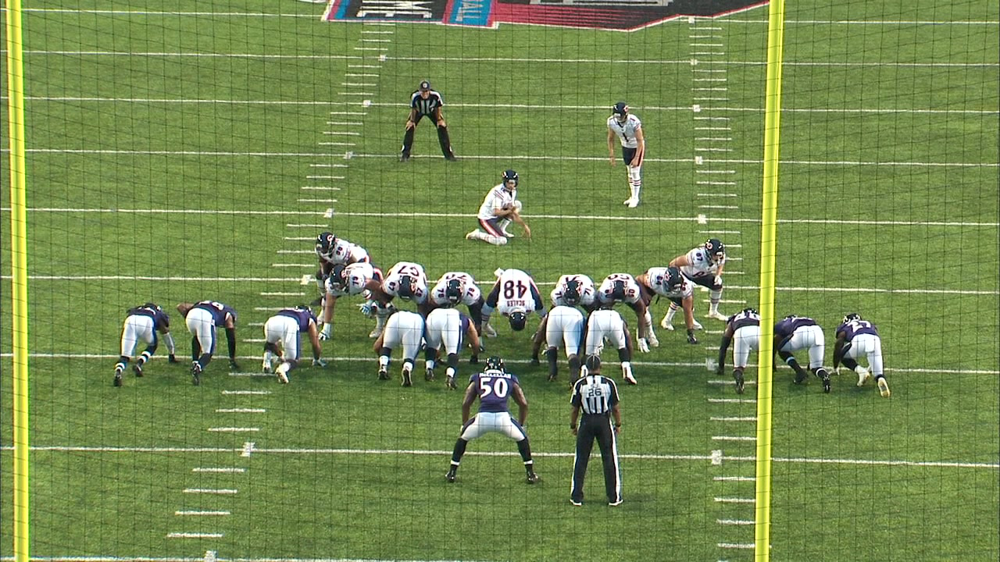

In [2]:
#load the image 
from PIL import Image,ImageDraw

img = Image.open('../input/nfl-health-and-safety-helmet-assignment/images/57502_000480_Endzone_frame0495.jpg')
img


We can see there are some players playing Football,¶
Now the helmets of the players are the objects that we need to detect.

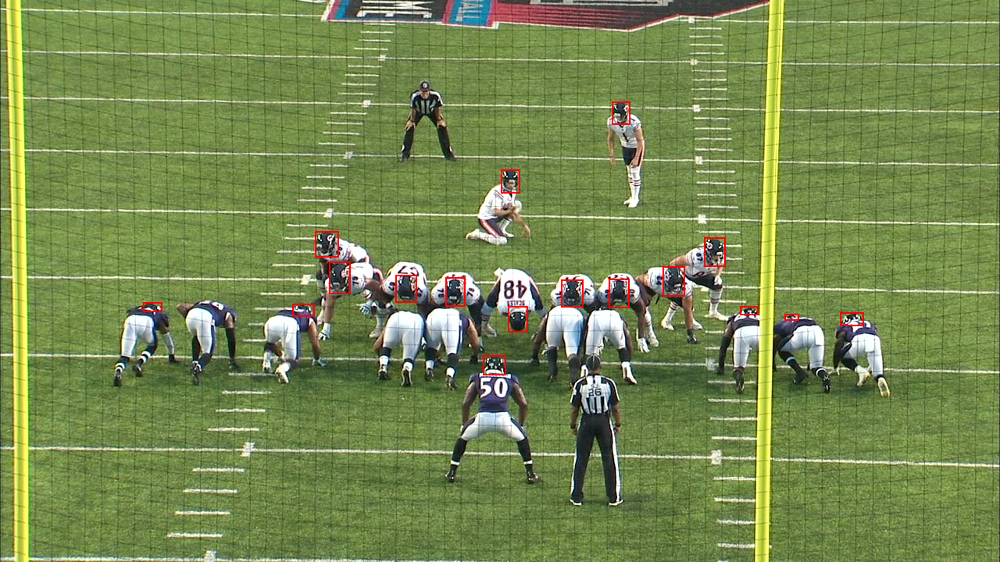

In [3]:
#point out the helmet of the player
import pandas as pd

df = pd.read_csv('../input/nfl-health-and-safety-helmet-assignment/image_labels.csv')
df = df.where(df["image"]=="57502_000480_Endzone_frame0495.jpg").dropna()

draw_obj = ImageDraw.Draw(img)

for _ ,(l, w, t, h) in df[['left', 'width', 'top', 'height']].iterrows():
        draw_obj.rectangle(((l, t), (l + w, t + h)), outline=(255, 0, 0), width=2)
        
img


As we can see that helmets of every players are detected properly, now give the proper label to each helmet
Every player has one helmet, and the label is the associate player's number.

In [4]:
#looking at submission file
submission_df = pd.read_csv('../input/nfl-health-and-safety-helmet-assignment/sample_submission.csv')
submission_df

,video_frame,label,left,width,top,height
0,57906_000718_Endzone_1,H22,1,1,1,1
1,57906_000718_Endzone_2,H22,1,1,1,1
2,57906_000718_Endzone_3,H22,1,1,1,1
3,57906_000718_Endzone_4,H22,1,1,1,1
4,57906_000718_Endzone_5,H22,1,1,1,1
...,...,...,...,...,...,...
2659,58102_002798_Sideline_362,H22,1,1,1,1
2660,58102_002798_Sideline_363,H22,1,1,1,1
2661,58102_002798_Sideline_364,H22,1,1,1,1
2662,58102_002798_Sideline_365,H22,1,1,1,1


In [5]:
submission_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2664 entries, 0 to 2663
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   video_frame  2664 non-null   object
 1   label        2664 non-null   object
 2   left         2664 non-null   int64 
 3   width        2664 non-null   int64 
 4   top          2664 non-null   int64 
 5   height       2664 non-null   int64 
dtypes: int64(4), object(2)
memory usage: 125.0+ KB


In [6]:
#load the file

df_image_labels = pd.read_csv('../input/nfl-health-and-safety-helmet-assignment/image_labels.csv')
df_image_labels.head()

,image,label,left,width,top,height
0,57503_000116_Endzone_frame443.jpg,Helmet,1099,16,456,15
1,57503_000116_Endzone_frame443.jpg,Helmet,1117,15,478,16
2,57503_000116_Endzone_frame443.jpg,Helmet,828,16,511,15
3,57503_000116_Endzone_frame443.jpg,Helmet,746,16,519,16
4,57503_000116_Endzone_frame443.jpg,Helmet,678,17,554,17


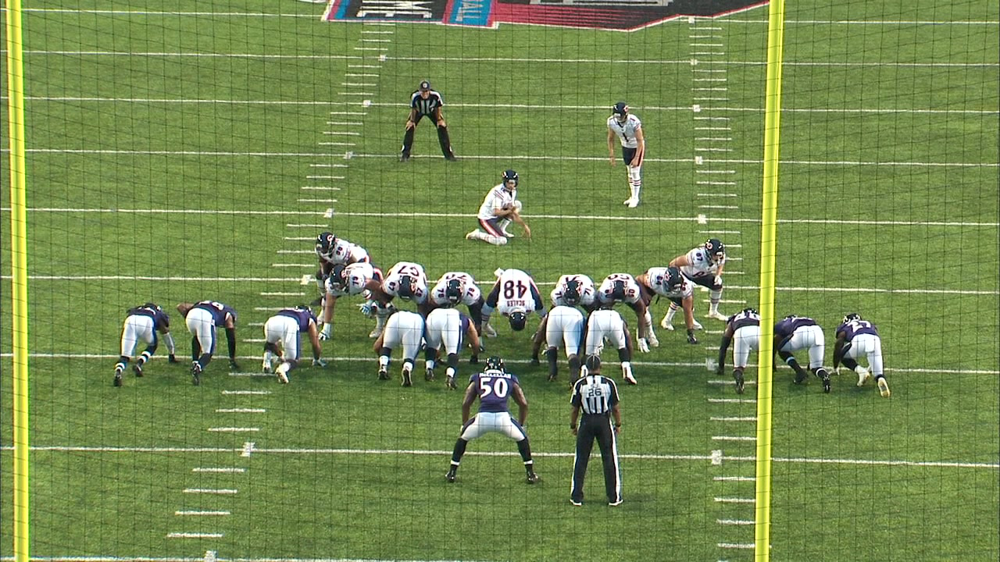

In [7]:
img = Image.open('../input/nfl-health-and-safety-helmet-assignment/images/57502_000480_Endzone_frame0495.jpg')
img

we see there is only one helmet marked
that means, every row in the image_label.csv represents a single helmet in a single image. As there are x helmets in an image then there will be x rows in the image_labels.csv corresponding to the same image
we can simply iterate over all the rows corresponding to our image and get all the helmets marked¶

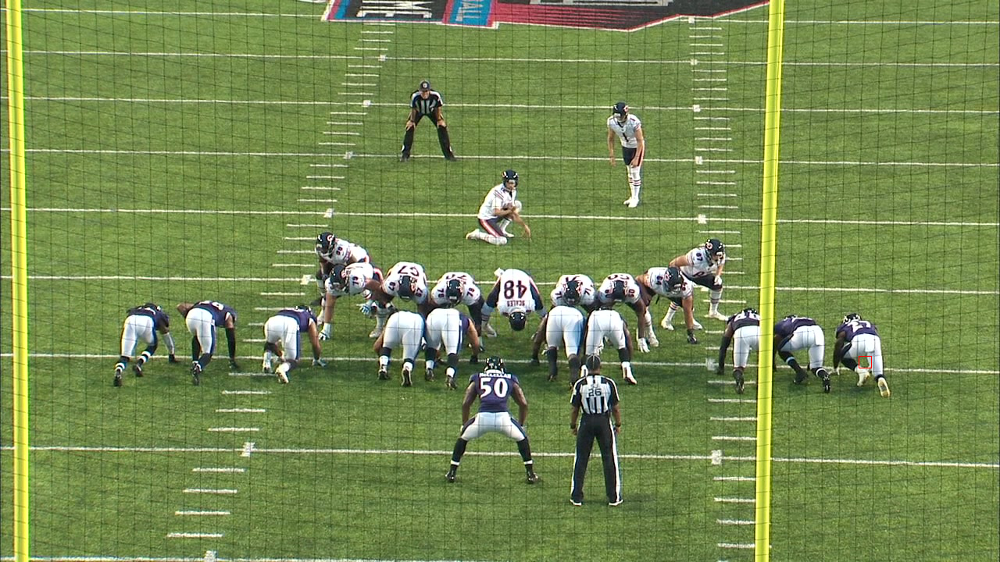

In [8]:
draw_obj = ImageDraw.Draw(img)

draw_obj.rectangle(((1099, 456), (1099 + 16, 456 + 15)), outline=(255, 0, 0))
img

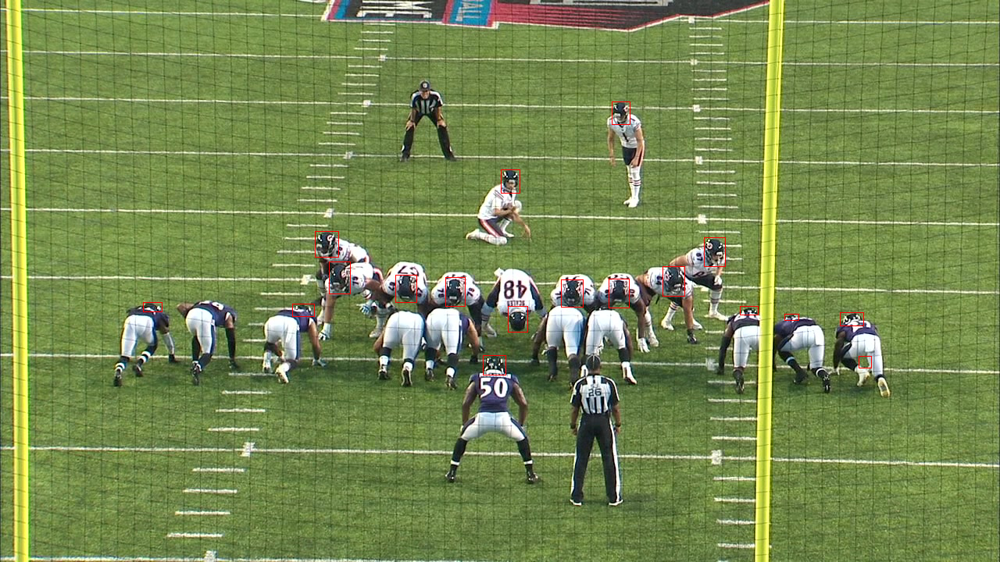

In [9]:
#predict the helmet in better way
df = df_image_labels.where(df_image_labels["image"]=="57502_000480_Endzone_frame0495.jpg").dropna()
for _ ,(l, w, t, h) in df[['left', 'width', 'top', 'height']].iterrows():
        draw_obj.rectangle(((l, t), (l + w, t + h)), outline=(255, 0, 0), width=1)

img

There are two cameras on ground 
Endzone view : is in the front wall
Sideline : on the side wall


In [10]:
from IPython.display import Video

**Endzone View**


In [11]:
Video("../input/nfl-health-and-safety-helmet-assignment/train/57583_000082_Endzone.mp4")

**Sideline**

In [12]:
Video("../input/nfl-health-and-safety-helmet-assignment/train/57583_000082_Sideline.mp4")

**note**: 
If video does not start here just duble click the video in the dataset and enjoy  ( $ _ $ )

We know that video is nothing but just a set of frames( images ) running very fast the rate at which frame moves is called as frame rate more formally no. of frames passed in one second is called as frame rate
Previously in the image_label.csv we saw that there is one image and a lot of helmets and each helmet is represented in one row of CSV file making it large. here we can think of two images ( one from the Endzone video and one from Sideline video ) representing the same situation in the play.
To simplify
There is a play
there are two videos for this pay
Each video contains a x frames
Each frame makes y rows in the train_label.csv ( i.e y helmets )
Now that we saw what’s there in the train folder we can start understanding train_label.csv


In [13]:
df_train_labels = pd.read_csv('../input/nfl-health-and-safety-helmet-assignment/train_labels.csv')
df_train_labels.head()

,video_frame,gameKey,playID,view,video,frame,label,left,width,top,height,impactType,isDefinitiveImpact,isSidelinePlayer
0,57583_000082_Endzone_1,57583,82,Endzone,57583_000082_Endzone.mp4,1,H90,245,21,327,29,None,False,False
1,57583_000082_Endzone_1,57583,82,Endzone,57583_000082_Endzone.mp4,1,V79,310,21,345,12,None,False,False
2,57583_000082_Endzone_1,57583,82,Endzone,57583_000082_Endzone.mp4,1,H97,410,21,323,29,None,False,False
3,57583_000082_Endzone_1,57583,82,Endzone,57583_000082_Endzone.mp4,1,V72,443,22,344,16,None,False,False
4,57583_000082_Endzone_1,57583,82,Endzone,57583_000082_Endzone.mp4,1,H50,518,21,212,28,None,False,False


Column names in the datafame so far

In [14]:
print(df_train_labels.columns)

Index(['video_frame', 'gameKey', 'playID', 'view', 'video', 'frame', 'label',
       'left', 'width', 'top', 'height', 'impactType', 'isDefinitiveImpact',
       'isSidelinePlayer'],
      dtype='object')


## The End